# Прогнозирование оттока клиентов

Необходимо научиться прогнозировать отток клиентов оператора связи. Если выяснится, что пользователь планирует уйти, ему будут предложены промокоды и специальные условия. 

Данные: персональные данные о клиентах, информация об их тарифах и договорах.

## Предобработка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import numpy as np
import shap
from sklearn.model_selection import cross_val_predict
import phik
from phik import resources, report
from phik.report import plot_correlation_matrix
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_selection import SelectPercentile, chi2
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from catboost import CatBoostClassifier
import warnings

warnings.filterwarnings('ignore')

### contract

Загружаем данные:

In [2]:
contract = pd.read_csv('https://code.s3.yandex.net/datasets/contract_new.csv')

Выведем первые 5 строк:

In [3]:
display(contract.head())

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1960.6
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.70,353.5


In [4]:
contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


Приведем данные к нужному типу:

In [5]:
contract['TotalCharges'] = pd.to_numeric(contract['TotalCharges'], errors = 'coerce')

In [6]:
pd.to_datetime(contract['BeginDate'],format='%Y%m%d', errors = 'coerce')
pd.to_datetime(contract['EndDate'],format='%Y%m%d', errors = 'coerce')
try:
    pd.to_datetime(contract['BeginDate'],format='%Y%m%d', errors = 'coerce')
    pd.to_datetime(contract['EndDate'],format='%Y%m%d', errors = 'coerce')
except:
    pd.to_datetime(contract['BeginDate'],format='%Y%m%d %H:%M:%S', errors = 'coerce')
    pd.to_datetime(contract['EndDate'],format='%Y%m%d %H:%M:%S', errors = 'coerce')

Проверим наличие дубликатов:

In [7]:
contract.duplicated().sum()

0

In [8]:
contract['customerID'].duplicated().sum()

0

Посчитаем пропуски в столбцах:

In [9]:
contract.isna().sum()

customerID           0
BeginDate            0
EndDate              0
Type                 0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
dtype: int64

Незначительное количество пропусков присутствует в столбце TotalCharges.

Функция для вывода уникальных значений столбцов:

In [10]:
def uniq(data):
    for column in data.columns:
        print(column, data[column].unique())

In [11]:
uniq(contract)

customerID ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']
BeginDate ['2020-01-01' '2017-04-01' '2019-10-01' '2016-05-01' '2019-09-01'
 '2019-03-01' '2018-04-01' '2019-04-01' '2017-07-01' '2014-12-01'
 '2019-01-01' '2018-10-01' '2015-04-01' '2015-09-01' '2018-01-01'
 '2014-05-01' '2015-10-01' '2014-03-01' '2018-05-01' '2019-11-01'
 '2019-02-01' '2016-01-01' '2017-08-01' '2015-12-01' '2014-02-01'
 '2018-06-01' '2019-12-01' '2017-11-01' '2019-06-01' '2016-04-01'
 '2017-02-01' '2018-12-01' '2014-04-01' '2018-09-01' '2014-11-01'
 '2016-07-01' '2015-02-01' '2018-07-01' '2014-08-01' '2016-03-01'
 '2018-08-01' '2014-10-01' '2015-06-01' '2016-08-01' '2019-05-01'
 '2017-03-01' '2016-02-01' '2017-09-01' '2014-09-01' '2017-12-01'
 '2016-12-01' '2017-06-01' '2015-05-01' '2016-10-01' '2016-09-01'
 '2019-08-01' '2019-07-01' '2017-05-01' '2017-10-01' '2014-07-01'
 '2018-03-01' '2015-01-01' '2018-11-01' '2015-03-01' '2018-02-01'
 '2016-06-01' '2015-08-01' '2015-11-

Обнаружены аномальные зачения в столбце EndDate - 'No'.

In [12]:
contract.loc[(contract['EndDate'] == "No")].count()

customerID          5942
BeginDate           5942
EndDate             5942
Type                5942
PaperlessBilling    5942
PaymentMethod       5942
MonthlyCharges      5942
TotalCharges        5931
dtype: int64

Построим ящик с усами для численных признаков:

In [13]:
contract['MonthlyCharges'].describe()

count    7043.000000
mean       64.761692
std        30.090047
min        18.250000
25%        35.500000
50%        70.350000
75%        89.850000
max       118.750000
Name: MonthlyCharges, dtype: float64

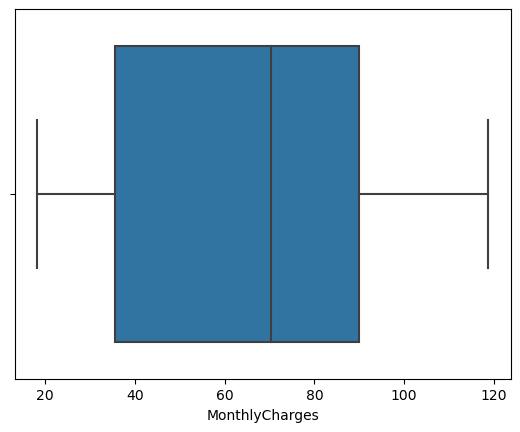

In [14]:
sns.boxplot(x=contract['MonthlyCharges'])
plt.show()

Аномальные значения и выбросы отсутствуют.

In [15]:
contract['TotalCharges'].describe()

count    7032.000000
mean     2118.621822
std      2112.736199
min        19.050000
25%       439.745000
50%      1345.275000
75%      3239.317500
max      9221.380000
Name: TotalCharges, dtype: float64

<AxesSubplot:xlabel='TotalCharges'>

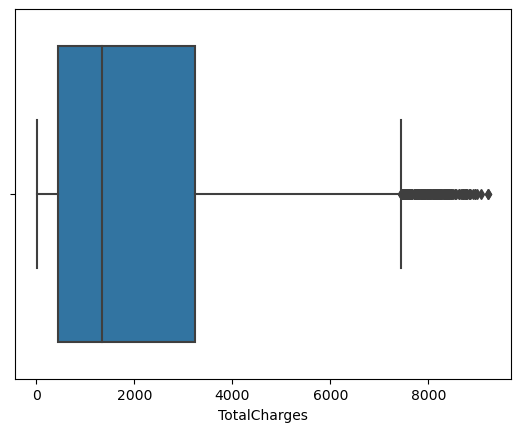

In [16]:
sns.boxplot(x=contract['TotalCharges'])

В столбце TotalCharges присутствуют выбросы.

Удалим выбросы:

In [17]:
Q1 = contract['TotalCharges'].quantile(0.25)
Q3 = contract['TotalCharges'].quantile(0.75)
IQR = Q3 - Q1
contract = contract.loc[(contract['TotalCharges'] >= Q1-1.5*IQR ) & (contract['TotalCharges'] <= Q3+1.5*IQR)]

In [18]:
contract['TotalCharges'].describe()

count    6837.000000
mean     1949.898493
std      1886.624395
min        19.050000
25%       420.240000
50%      1280.300000
75%      3027.580000
max      7430.940000
Name: TotalCharges, dtype: float64

<AxesSubplot:xlabel='TotalCharges'>

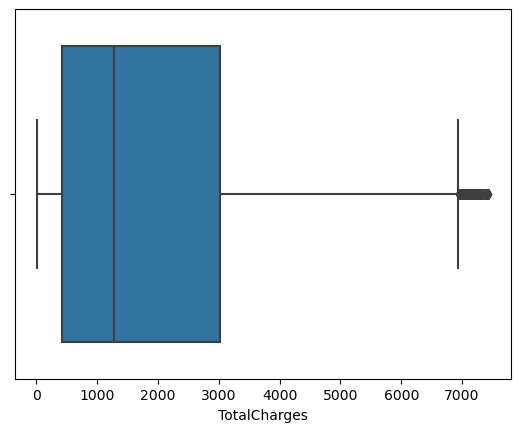

In [19]:
sns.boxplot(x=contract['TotalCharges'])

In [20]:
contract.shape

(6837, 8)

### personal

Загружаем данные:

In [21]:
personal = pd.read_csv('https://code.s3.yandex.net/datasets/personal_new.csv')

Выведем первые 5 строк:

In [22]:
display(personal.head())

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No


In [23]:
personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


Проверим наличие дубликатов:

In [24]:
personal.duplicated().sum()

0

In [25]:
personal['customerID'].duplicated().sum()

0

Посчитаем пропуски в столбцах:

In [26]:
personal.isna().sum()

customerID       0
gender           0
SeniorCitizen    0
Partner          0
Dependents       0
dtype: int64

Вызовем функцию uniq:

In [27]:
uniq(personal)

customerID ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']
gender ['Female' 'Male']
SeniorCitizen [0 1]
Partner ['Yes' 'No']
Dependents ['No' 'Yes']


### internet

Загружаем данные:

In [28]:
internet = pd.read_csv('https://code.s3.yandex.net/datasets/internet_new.csv')

Выведем первые 5 строк:

In [29]:
display(internet.head())

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No


In [30]:
internet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


Проверим наличие дубликатов:

In [31]:
internet.duplicated().sum()

0

In [32]:
internet['customerID'].duplicated().sum()

0

Посчитаем пропуски в столбцах:

In [33]:
internet.isna().sum()

customerID          0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
dtype: int64

Вызовем функцию uniq:

In [34]:
uniq(internet)

customerID ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']
InternetService ['DSL' 'Fiber optic']
OnlineSecurity ['No' 'Yes']
OnlineBackup ['Yes' 'No']
DeviceProtection ['No' 'Yes']
TechSupport ['No' 'Yes']
StreamingTV ['No' 'Yes']
StreamingMovies ['No' 'Yes']


### phone

Загружаем данные:

In [35]:
phone = pd.read_csv('https://code.s3.yandex.net/datasets/phone_new.csv')

Выведем первые 5 строк:

In [36]:
display(phone.head())

,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes


In [37]:
phone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


Проверим наличие дубликатов:

In [38]:
phone.duplicated().sum()

0

In [39]:
phone['customerID'].duplicated().sum()

0

Посчитаем пропуски в столбцах:

In [40]:
phone.isna().sum()

customerID       0
MultipleLines    0
dtype: int64

Вызовем функцию uniq:

In [41]:
uniq(phone)

customerID ['5575-GNVDE' '3668-QPYBK' '9237-HQITU' ... '2234-XADUH' '8361-LTMKD'
 '3186-AJIEK']
MultipleLines ['No' 'Yes']


## Вывод
В данных отсутствуют дубликаты.

Данные были проверены на аномалии, были удалены выбросы.

Данные распределены по разным таблицам, в дальнейшем потребуется объединение таблиц.

В данных отсутствует целевой признак, но присутствуют признаки даты, которые можно будет преобразовать к новому признаку - длительности и использовать в моделировании новый признак.

Датасеты имеют разные размерности, так как не все клиенты пользуются всеми пакетами услуг и сервисов - phone и internet. 

План по дальнейшим действиям:
1) составление портрета клиента: исследование признаков

2) определение наиболее важных признаков для целевого признака, корреляция

3) масштабирование данных для модели, кодирование

3) создание модели, подбор гиперпараметров

4) анализ модели с помощью матрицы ошибок

5) метрика модели

6) тестирование модели

7) выводы о проделанной работе

## Исследовательский анализ

Добавим в таблицу Contract новый столбец: продолжительность контракта, количество дней - number_of_days. Поскольку данные актуальны на 1 февраля 2020 года, то для тех клиентов, у которых EndDate = 'No', продолжительность рассчитаем так: 2020-02-01 - 'BeginDate'.

In [42]:
contract.loc[contract['EndDate']=='No', 'EndDate'] = '2020-02-01'

In [43]:
contract['BeginDate'] = pd.to_datetime(contract['BeginDate'])
contract['EndDate'] = pd.to_datetime(contract['EndDate'])
contract['number_of_days'] = (contract['EndDate'] - contract['BeginDate']).dt.days

In [44]:
contract.head(15)

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,number_of_days
0,7590-VHVEG,2020-01-01,2020-02-01,Month-to-month,Yes,Electronic check,29.85,31.04,31
1,5575-GNVDE,2017-04-01,2020-02-01,One year,No,Mailed check,56.95,2071.84,1036
2,3668-QPYBK,2019-10-01,2020-02-01,Month-to-month,Yes,Mailed check,53.85,226.17,123
3,7795-CFOCW,2016-05-01,2020-02-01,One year,No,Bank transfer (automatic),42.30,1960.60,1371
4,9237-HQITU,2019-09-01,2020-02-01,Month-to-month,Yes,Electronic check,70.70,353.50,153
5,9305-CDSKC,2019-03-01,2020-02-01,Month-to-month,Yes,Electronic check,99.65,1150.96,337
6,1452-KIOVK,2018-04-01,2020-02-01,Month-to-month,Yes,Credit card (automatic),89.10,2058.21,671
7,6713-OKOMC,2019-04-01,2020-02-01,Month-to-month,No,Mailed check,29.75,300.48,306
8,7892-POOKP,2017-07-01,2020-02-01,Month-to-month,Yes,Electronic check,104.80,3573.68,945
9,6388-TABGU,2014-12-01,2017-05-01,One year,No,Bank transfer (automatic),56.15,1628.35,882


Объединение таблиц contract и personal:

In [45]:
contract_personal = personal.merge(contract, on = 'customerID', how='outer')
contract_personal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerID        7043 non-null   object        
 1   gender            7043 non-null   object        
 2   SeniorCitizen     7043 non-null   int64         
 3   Partner           7043 non-null   object        
 4   Dependents        7043 non-null   object        
 5   BeginDate         6837 non-null   datetime64[ns]
 6   EndDate           6837 non-null   datetime64[ns]
 7   Type              6837 non-null   object        
 8   PaperlessBilling  6837 non-null   object        
 9   PaymentMethod     6837 non-null   object        
 10  MonthlyCharges    6837 non-null   float64       
 11  TotalCharges      6837 non-null   float64       
 12  number_of_days    6837 non-null   float64       
dtypes: datetime64[ns](2), float64(3), int64(1), object(7)
memory usage: 770.3+ KB


Объединение таблиц contract_personal и internet:

In [46]:
contract_personal_internet = contract_personal.merge(internet, on = 'customerID', how='outer')

Итоговая таблица:

In [47]:
result_table = contract_personal_internet.merge(phone, on = 'customerID', how='outer')

In [48]:
result_table.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerID        7043 non-null   object        
 1   gender            7043 non-null   object        
 2   SeniorCitizen     7043 non-null   int64         
 3   Partner           7043 non-null   object        
 4   Dependents        7043 non-null   object        
 5   BeginDate         6837 non-null   datetime64[ns]
 6   EndDate           6837 non-null   datetime64[ns]
 7   Type              6837 non-null   object        
 8   PaperlessBilling  6837 non-null   object        
 9   PaymentMethod     6837 non-null   object        
 10  MonthlyCharges    6837 non-null   float64       
 11  TotalCharges      6837 non-null   float64       
 12  number_of_days    6837 non-null   float64       
 13  InternetService   5517 non-null   object        
 14  OnlineSecurity    5517 n

In [49]:
result_table.isna().sum()

customerID             0
gender                 0
SeniorCitizen          0
Partner                0
Dependents             0
BeginDate            206
EndDate              206
Type                 206
PaperlessBilling     206
PaymentMethod        206
MonthlyCharges       206
TotalCharges         206
number_of_days       206
InternetService     1526
OnlineSecurity      1526
OnlineBackup        1526
DeviceProtection    1526
TechSupport         1526
StreamingTV         1526
StreamingMovies     1526
MultipleLines        682
dtype: int64

После объединения таблиц в данных образовались пропуски из-за разных размерностей таблиц.

В таблице contract были удалены выбросы, при объединении таблиц эти выбросы стали пропусками, удалим их:

In [50]:
result_table = result_table.dropna(subset=['BeginDate'])

Поскольку клиенты пользуются не всеми сервисами и услугами компании, то пропуски, возникшие при объединении таблиц можно заполнить значением 'not have', т е пользователь не подключал эту услугу:

In [51]:
for col in result_table.columns:
    result_table.loc[result_table[col].isnull(), col] = 'not have'

In [52]:
result_table.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6837 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        6837 non-null   object
 1   gender            6837 non-null   object
 2   SeniorCitizen     6837 non-null   object
 3   Partner           6837 non-null   object
 4   Dependents        6837 non-null   object
 5   BeginDate         6837 non-null   object
 6   EndDate           6837 non-null   object
 7   Type              6837 non-null   object
 8   PaperlessBilling  6837 non-null   object
 9   PaymentMethod     6837 non-null   object
 10  MonthlyCharges    6837 non-null   object
 11  TotalCharges      6837 non-null   object
 12  number_of_days    6837 non-null   object
 13  InternetService   6837 non-null   object
 14  OnlineSecurity    6837 non-null   object
 15  OnlineBackup      6837 non-null   object
 16  DeviceProtection  6837 non-null   object
 17  TechSupport   

Данные обработаны, пропуски удалены и заполнены, теперь можно приступать к выявлению наиболее важных факторов для модели.

Создадим целевой признак: 'leave'. У него будет 2 значения: 

'yes' - клиент ушел и 'no' - клиент остался

leave='no', если EndDate = '2020-02-01'

leave='yes', если EndDate != '2020-02-01'

In [53]:
result_table['EndDate'] = pd.to_datetime(result_table['EndDate']).dt.date

In [54]:
from datetime import datetime
result_table.loc[result_table['EndDate']== pd.to_datetime('2020-02-01'), 'leave'] = 'no'
result_table.loc[result_table['EndDate']!=pd.to_datetime('2020-02-01'), 'leave'] = 'yes'

Удалим столбцы 'customerID', 'BeginDate', 'EndDate':

In [55]:
result_table = result_table.drop(columns = ['customerID', 'BeginDate', 'EndDate'])

Преобразуем типы данных в столбцах 'TotalCharges' и 'MonthlyCharges':

In [56]:
result_table['TotalCharges'] = pd.to_numeric(result_table['TotalCharges'], errors = 'coerce')
result_table['MonthlyCharges'] = pd.to_numeric(result_table['MonthlyCharges'], errors = 'coerce')

Построим корреляционную матрицу:

In [57]:
interval_cols = ['MonthlyCharges', 'TotalCharges']
phik_overview = result_table.phik_matrix(interval_cols = interval_cols)

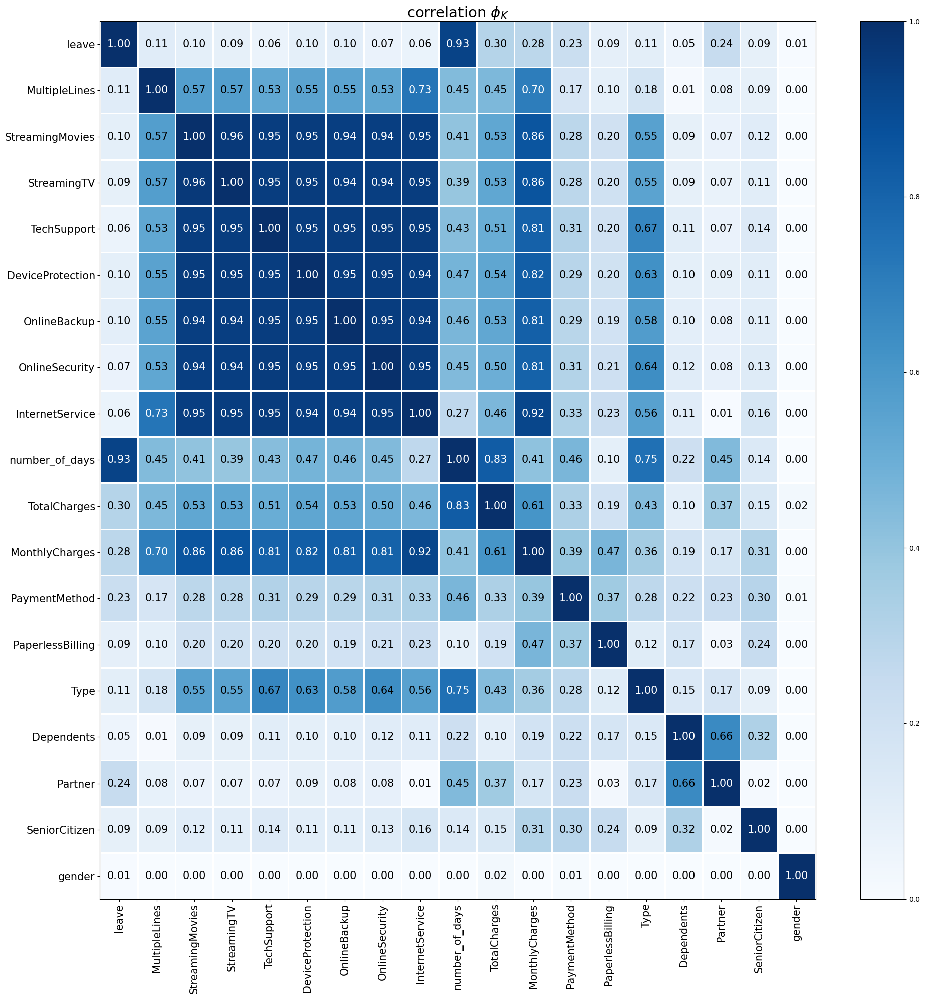

In [58]:
plot_correlation_matrix(phik_overview.values, x_labels=phik_overview.columns, y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map='Blues', title=r'correlation $\phi_K$', fontsize_factor=1.5,
                        figsize=(20,20))
plt.tight_layout()

Удалим три параметра с самой низкой корреляцией 'InternetService', 'Dependents', 'gender', 'TechSupport':

In [59]:
result_table = result_table.drop(columns = ['InternetService', 'Dependents', 'gender', 'TechSupport'])

In [60]:
result_table.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6837 entries, 0 to 7042
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SeniorCitizen     6837 non-null   object 
 1   Partner           6837 non-null   object 
 2   Type              6837 non-null   object 
 3   PaperlessBilling  6837 non-null   object 
 4   PaymentMethod     6837 non-null   object 
 5   MonthlyCharges    6837 non-null   float64
 6   TotalCharges      6837 non-null   float64
 7   number_of_days    6837 non-null   object 
 8   OnlineSecurity    6837 non-null   object 
 9   OnlineBackup      6837 non-null   object 
 10  DeviceProtection  6837 non-null   object 
 11  StreamingTV       6837 non-null   object 
 12  StreamingMovies   6837 non-null   object 
 13  MultipleLines     6837 non-null   object 
 14  leave             6837 non-null   object 
dtypes: float64(2), object(13)
memory usage: 854.6+ KB


Наблюдается сильная мультиколлинеарность между 'StreamingMovies', 'StreamingTV', 'DeviceProtection', 'OnlineBackup', 'OnlineSecurity'.

Рассчитаем корреляцию между параметрами, коэффициенты Спирмена:

In [61]:
print(result_table['StreamingMovies'].corr(result_table['StreamingTV'], method="spearman"))
print(result_table['StreamingMovies'].corr(result_table['DeviceProtection'], method="spearman"))
print(result_table['StreamingMovies'].corr(result_table['OnlineBackup'], method="spearman"))
print(result_table['StreamingMovies'].corr(result_table['OnlineSecurity'], method="spearman"))

0.7643935528585385
0.705688287039831
0.64277660313276
0.6199934884942895


In [62]:
print(result_table['OnlineBackup'].corr(result_table['OnlineSecurity'], method="spearman"))

0.6739078420130847


Корреляция между 'StreamingMovies' и 'StreamingTV' = 0.764393552858538, удалим столбец 'StreamingTV'.
Корреляция между 'StreamingMovies' и 'DeviceProtection' = 0.705688287039831, удалим столбец 'DeviceProtection'.

Корреляция между 'OnlineBackup' и 'OnlineSecurity' = 0.6739078420130847, удалим столбец 'OnlineSecurity'.

In [63]:
result_table = result_table.drop(columns = ['StreamingTV', 'DeviceProtection', 'OnlineSecurity'])

In [64]:
result_table.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6837 entries, 0 to 7042
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SeniorCitizen     6837 non-null   object 
 1   Partner           6837 non-null   object 
 2   Type              6837 non-null   object 
 3   PaperlessBilling  6837 non-null   object 
 4   PaymentMethod     6837 non-null   object 
 5   MonthlyCharges    6837 non-null   float64
 6   TotalCharges      6837 non-null   float64
 7   number_of_days    6837 non-null   object 
 8   OnlineBackup      6837 non-null   object 
 9   StreamingMovies   6837 non-null   object 
 10  MultipleLines     6837 non-null   object 
 11  leave             6837 non-null   object 
dtypes: float64(2), object(10)
memory usage: 694.4+ KB


Построим графики для пар признаков с высокой корреляцией:

'leave' и 'number_of_days':  0.93

'MultipleLines' и 'TotalCharges':  0.57

'StreamingMovies' и 'StreamingTV':  0.61

'StreamingMovies' и 'MonthlyCharges':  0.70

'StreamingTV' и 'MonthlyCharges':  0.71

'DeviceProtection' и 'TotalCharges':  0.50

'number_of_days' и 'TotalCharges':  0.83

'number_of_days' и 'Type':  0.75

'TotalCharges' и 'MonthlyCharges':  0.61

Строим графики для категориальных и численных признаков:

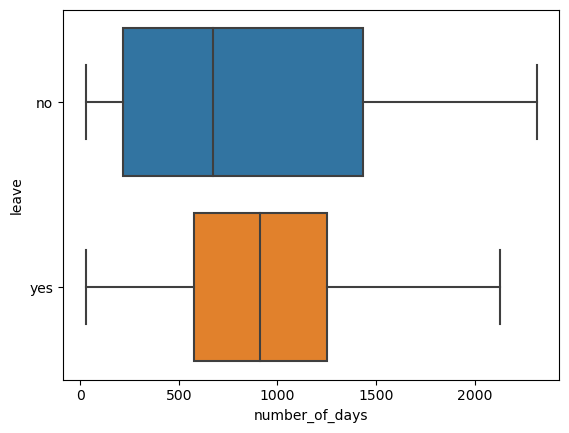

In [65]:
sns.boxplot(data = result_table, x = 'number_of_days', y = 'leave', fliersize = 4, whis = 6)
plt.show()

Оставшиеся клиенты пользуются услугами компании на протяжении разного времени: от полугода до 4 лет.

Уходящие клиенты пользовались услугами компании на протяжении 2 - 3,5 лет.

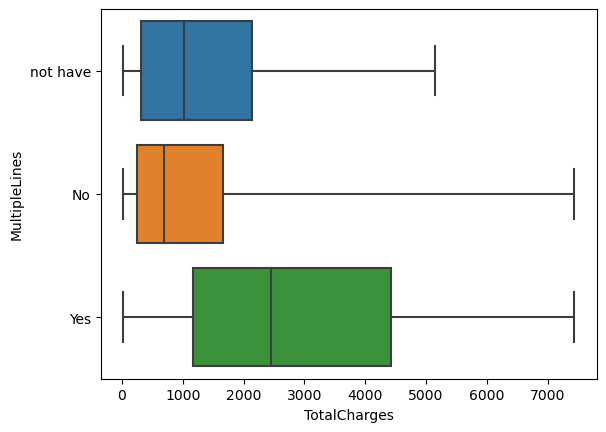

In [66]:
sns.boxplot(data = result_table, x = 'TotalCharges', y = 'MultipleLines', fliersize = 4, whis = 6)
plt.show()

Итоговые расходы клиентов, которые платят за стационарную телефонную связь, больше, чем у клиентов не использующих эту связь.

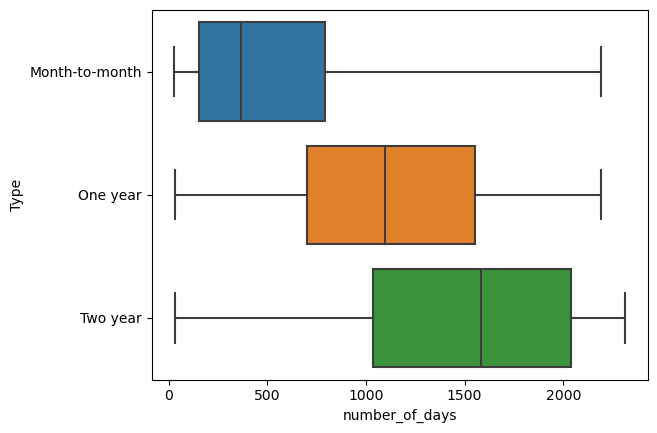

In [67]:
sns.boxplot(data = result_table, x = 'number_of_days', y = 'Type', fliersize = 4, whis = 6)
plt.show()

Клиенты, которые помесячно оплачивают услуги, пользуются услугами компании от полугода до 2-х.

Клиенты, которые ежегодно вносят плату, пользуются услугами от 2-х до 4,5 лет.

Клиенты, которые каждые 2 года вносят оплату, пользуются услугами примерно от 3 до 6 лет.

Построим диаграммы рассеяния для числовых признаков:

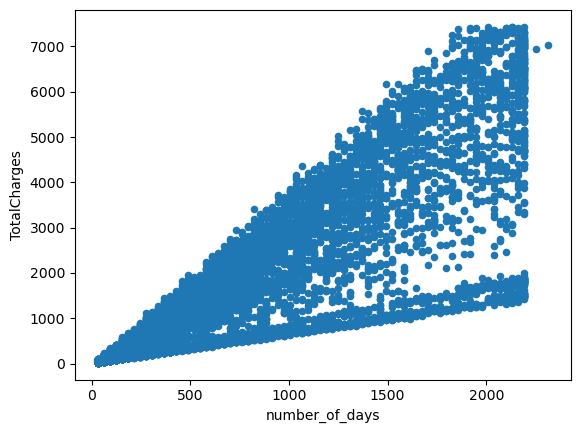

In [68]:
result_table.plot.scatter (x='number_of_days', y='TotalCharges')
plt.show()

С ростом продолжительности, количества дней, увеличиваются и итоговые платы.

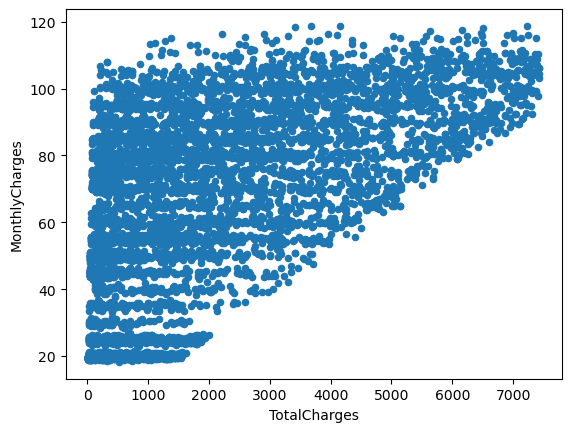

In [69]:
result_table.plot.scatter (x='TotalCharges', y='MonthlyCharges')
plt.show()

С ростом месячной платы увеличивается и итоговая плата.

## Портрет уходящего клиента

Отберем данные клиентов, которые ушли:

In [70]:
data_leave_yes = result_table.loc[result_table['leave']=='yes']

In [71]:
data_leave_yes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1098 entries, 9 to 7034
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SeniorCitizen     1098 non-null   object 
 1   Partner           1098 non-null   object 
 2   Type              1098 non-null   object 
 3   PaperlessBilling  1098 non-null   object 
 4   PaymentMethod     1098 non-null   object 
 5   MonthlyCharges    1098 non-null   float64
 6   TotalCharges      1098 non-null   float64
 7   number_of_days    1098 non-null   object 
 8   OnlineBackup      1098 non-null   object 
 9   StreamingMovies   1098 non-null   object 
 10  MultipleLines     1098 non-null   object 
 11  leave             1098 non-null   object 
dtypes: float64(2), object(10)
memory usage: 111.5+ KB


Для каждого параметра в таблице, сделаем группировку и посчитаем количество записей для каждой категории:

In [72]:
for col in data_leave_yes.columns:
    if col not in ['MonthlyCharges', 'TotalCharges', 'number_of_days']:
        dat = data_leave_yes.groupby(col).count()
        display(dat.iloc[:, 0])

SeniorCitizen
0    867
1    231
Name: Partner, dtype: int64

Partner
No     382
Yes    716
Name: SeniorCitizen, dtype: int64

Type
Month-to-month    407
One year          311
Two year          380
Name: SeniorCitizen, dtype: int64

PaperlessBilling
No     380
Yes    718
Name: SeniorCitizen, dtype: int64

PaymentMethod
Bank transfer (automatic)    315
Credit card (automatic)      317
Electronic check             349
Mailed check                 117
Name: SeniorCitizen, dtype: int64

OnlineBackup
No          381
Yes         557
not have    160
Name: SeniorCitizen, dtype: int64

StreamingMovies
No          335
Yes         603
not have    160
Name: SeniorCitizen, dtype: int64

MultipleLines
No          319
Yes         676
not have    103
Name: SeniorCitizen, dtype: int64

leave
yes    1098
Name: SeniorCitizen, dtype: int64

Большая часть уходящих клиентов не являются пенсионерами, есть супруга/супруг, чек был в электронном виде, не использовалось облачное хранилище файлов для резервного копирования данных, не использовали антивирус, не было выделенной линии технической поддержки, пользовались стриминговым телевидением и каталогом фильмов, использовали стационарную телефонную связь.

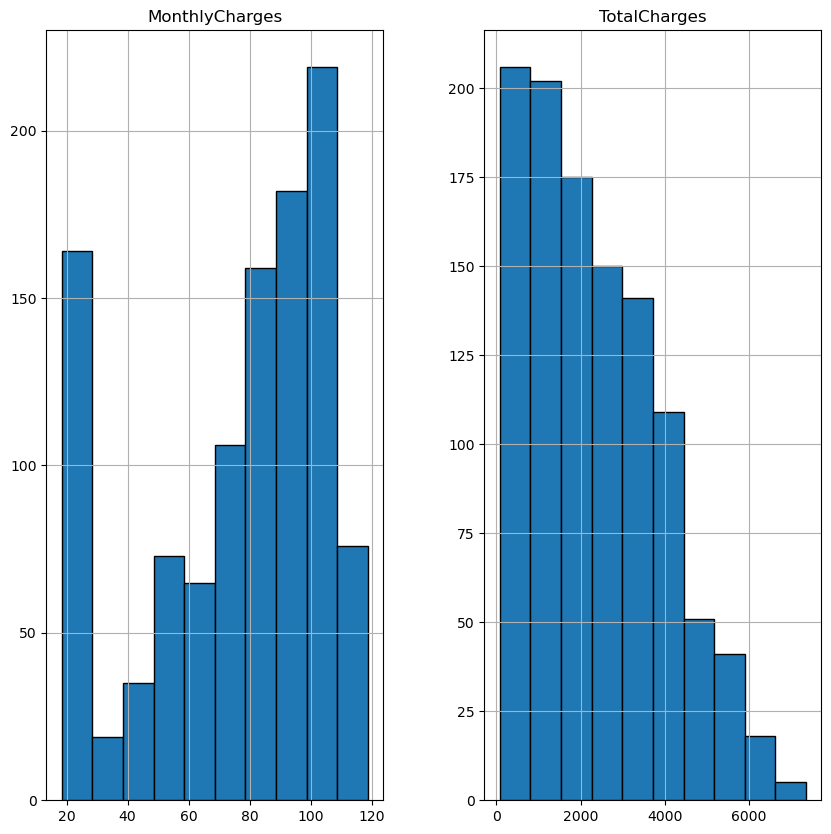

In [73]:
data_leave_yes.hist(edgecolor='black', figsize = (10, 10))
plt.show()

Месячная плата у большинства клиентов была большая (80-110). Итоговая плата была небольшая (в основном до 3500).
В среднем услугами компании поьзовались на протяжении 1,5 - 4 лет.

Баланс классов:

no     0.839403
yes    0.160597
Name: leave, dtype: float64


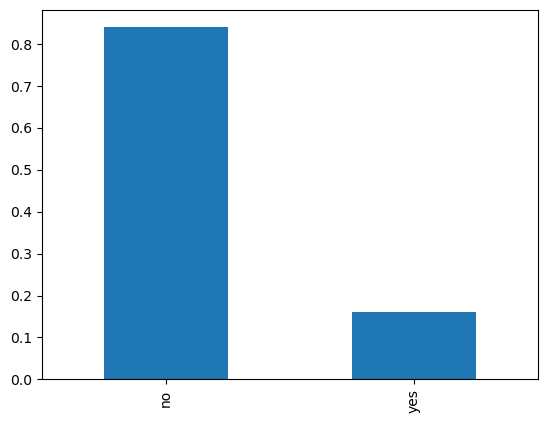

In [74]:
class_frequency = result_table['leave'].value_counts(normalize = True)
print(class_frequency)
class_frequency.plot(kind='bar')
plt.show()

В целевом признаке присутствует дисбаланс классов.

## Обучение моделей

Выделим целевой признак в отдельную переменную:

In [75]:
X = result_table.drop(columns = 'leave')
y = result_table['leave']

Масштабирование численных признаков:

In [76]:
numeric_features = ['MonthlyCharges', 'TotalCharges', 'number_of_days']
numeric_transformer = Pipeline(
    steps=[("scaler", StandardScaler())]
)

Кодирование категориальных признаков:

In [77]:
res_tab = X.drop(columns = ['MonthlyCharges', 'TotalCharges', 'number_of_days'])
categ = res_tab.columns

categorical_features = categ
categorical_transformer = Pipeline(
    steps=[
        ("encoder", OneHotEncoder(handle_unknown="ignore", drop = 'first')),
        ("selector", SelectPercentile(chi2, percentile=50)),
    ]
)

Объединяем два Pipeline:

In [78]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

Разбиваем данные на тренировочную и тестовую выборки:

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=220523)

### Logistic regression

Построим модель логистической регрессии:

In [80]:
logistic = LogisticRegression(max_iter=10000, tol=0.1) #max_iter=10000, tol=0.1
pipe = Pipeline(steps=[("preprocessor", preprocessor), ("logistic", logistic)])

param_grid = { 'logistic__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
               'logistic__penalty':['elasticnet', 'l1', 'l2'],
               'logistic__C':[0.001, 0.01, 0.1, 1, 10, 100],
               'logistic__random_state': [220523]
    
}

search = GridSearchCV(pipe, param_grid, n_jobs=2, scoring = 'roc_auc')
search.fit(X_train, y_train)
print(search.best_params_)

{'logistic__C': 100, 'logistic__penalty': 'l2', 'logistic__random_state': 220523, 'logistic__solver': 'saga'}


In [81]:
logistic = LogisticRegression(C = 100, solver = 'saga', penalty = 'l2', random_state = 220523)
pipe = Pipeline(steps=[("preprocessor", preprocessor), ("logistic", logistic)])
scores = cross_val_score(pipe, X_train, y_train, scoring='roc_auc', cv=4)
final_score = sum(scores)/len(scores)
print('Средняя оценка качества модели:', final_score)

Средняя оценка качества модели: 0.7476497784794407


### RandomForestClassifier

Построим модель случайного леса:

In [82]:
rand_for = RandomForestClassifier()
rnd_clf = Pipeline(
    steps=[("preprocessor", preprocessor), ("rnd_clf", rand_for)]
)


params_grid = { 
    'rnd_clf__n_estimators': range(1, 10, 1),
    'rnd_clf__max_features': ['auto', 'sqrt', 'log2'],
    'rnd_clf__max_depth' : [6,7,8,9,10],
    'rnd_clf__criterion' :['gini', 'entropy'],
    'rnd_clf__random_state': [220523]
}

search = GridSearchCV(rnd_clf, params_grid, n_jobs=2, scoring = 'roc_auc')
search.fit(X_train, y_train)
print(search.best_params_)

{'rnd_clf__criterion': 'entropy', 'rnd_clf__max_depth': 6, 'rnd_clf__max_features': 'auto', 'rnd_clf__n_estimators': 9, 'rnd_clf__random_state': 220523}


In [83]:
rnd_clf = RandomForestClassifier(criterion = 'entropy', max_depth = 6, 
                                 max_features = 'auto', n_estimators = 9, random_state = 220523)
rnd_clf = Pipeline(
    steps=[("preprocessor", preprocessor), ("rnd_clf", rnd_clf)]
)
scores = cross_val_score(rnd_clf, X_train, y_train, scoring='roc_auc', cv=5)
final_score = sum(scores)/len(scores)
print('Средняя оценка качества модели:', final_score)

Средняя оценка качества модели: 0.8103734324280458


### Catboost

Построим модель Catboost:

In [86]:
clf = CatBoostClassifier()
rnd_clf = Pipeline(
    steps=[("preprocessor", preprocessor), ("clf", clf)]
)
params = {'clf__iterations': range(100, 500, 50),
          'clf__depth': [4, 5, 6, 7, 8],
          #'clf__l2_leaf_reg': np.logspace(-20, -19, 3),
          'clf__leaf_estimation_iterations': range(0, 10, 2),
          #'clf__logging_level':['Silent'],
          'clf__random_seed': [220523],
          'clf__eval_metric': ['AUC']
          #'clf__learning_rate': np.arange(0.00, 0.15, 0.05)
          
          #'clf__random_strength' :[0.001],
          #'clf__grow_policy' : ['SymmetricTree', 'Depthwise', 'Lossguide'],
          #'clf__min_data_in_leaf' : [2, 3, 4, 5]
          #'clf__max_leaves' : [2, 3, 4, 5]
         }
clf_grid = GridSearchCV(estimator=rnd_clf, param_grid=params, cv=5, n_jobs=-1)
clf_grid.fit(X_train, y_train)
best_param = clf_grid.best_params_
best_param

200:	total: 891ms	remaining: 1.1s
201:	total: 895ms	remaining: 1.1s
202:	total: 901ms	remaining: 1.1s
203:	total: 905ms	remaining: 1.09s
204:	total: 908ms	remaining: 1.08s
205:	total: 912ms	remaining: 1.08s
206:	total: 916ms	remaining: 1.07s
207:	total: 919ms	remaining: 1.07s
208:	total: 922ms	remaining: 1.06s
209:	total: 925ms	remaining: 1.06s
210:	total: 929ms	remaining: 1.05s
211:	total: 934ms	remaining: 1.05s
212:	total: 937ms	remaining: 1.04s
213:	total: 940ms	remaining: 1.04s
214:	total: 944ms	remaining: 1.03s
215:	total: 948ms	remaining: 1.03s
216:	total: 951ms	remaining: 1.02s
217:	total: 954ms	remaining: 1.01s
218:	total: 960ms	remaining: 1.01s
219:	total: 966ms	remaining: 1.01s
220:	total: 969ms	remaining: 1s
221:	total: 975ms	remaining: 1s
222:	total: 979ms	remaining: 996ms
223:	total: 982ms	remaining: 991ms
224:	total: 985ms	remaining: 985ms
225:	total: 988ms	remaining: 979ms
226:	total: 995ms	remaining: 977ms
227:	total: 1000ms	remaining: 973ms
228:	total: 1s	remaining: 96

{'clf__depth': 5,
 'clf__eval_metric': 'AUC',
 'clf__iterations': 450,
 'clf__leaf_estimation_iterations': 8,
 'clf__random_seed': 220523}

In [87]:
clf = CatBoostClassifier(depth = 2,
                         eval_metric = 'AUC',
                         iterations = 10000,
                         #l2_leaf_reg = 3.162277660168379e-20,
                         leaf_estimation_iterations = 8,
                         #learning_rate = 0.1,
                         logging_level = 'Silent',
                         random_seed = 220523,
                         random_strength = 3
                        )

rnd_clf = Pipeline(
    steps=[("preprocessor", preprocessor), ("clf", clf)]
)
rnd_clf.fit(X_train, y_train)
scores = cross_val_score(rnd_clf, X_train, y_train, scoring='roc_auc', cv=5, n_jobs=-1)
final_score = sum(scores)/len(scores)
print('Средняя оценка качества модели:', final_score)

Средняя оценка качества модели: 0.9171639118275333


Лучшая модель - Catboost, значение roc_auc = 0.9171639118275333

## Тестирование модели

In [88]:
from sklearn.metrics import accuracy_score

In [89]:
proba = rnd_clf.predict_proba(X_test)
proba = proba[:, 1]
print("AUC-ROC наилучшей модели на тестовой выборке:", roc_auc_score(y_test, proba))
y_test = y_test.replace('no', 0)
y_test = y_test.replace('yes', 1)
print('Accuracy наилучшей модели на тестовой выборке:', accuracy_score(y_test, proba.round()))

AUC-ROC наилучшей модели на тестовой выборке: 0.9313676339808687
Accuracy наилучшей модели на тестовой выборке: 0.939766081871345


Значение roc_auc на тестовой выборке = 0.9313676339808687

Значение accuracy на тестовой выборке = 0.939766081871345

## Анализ выбранной модели

Отберем параметры, которые оказывают наибольшее влияние на предсказание:

In [90]:
cat_boost = rnd_clf["clf"]
importances = cat_boost.feature_importances_

In [91]:
import time
import numpy as np

start_time = time.time()
importances = cat_boost.feature_importances_
categories = rnd_clf[:-1].get_feature_names_out()

In [92]:
df = pd.DataFrame({'x':categories, 'y':importances})

In [93]:
df

,x,y
0,num__MonthlyCharges,10.895637
1,num__TotalCharges,12.250031
2,num__number_of_days,66.116383
3,cat__Partner_Yes,1.959959
4,cat__Type_One year,1.472532
5,cat__Type_Two year,2.884270
6,cat__PaymentMethod_Mailed check,1.508007
7,cat__OnlineBackup_Yes,0.928058
8,cat__StreamingMovies_Yes,0.583009
9,cat__MultipleLines_Yes,1.402115


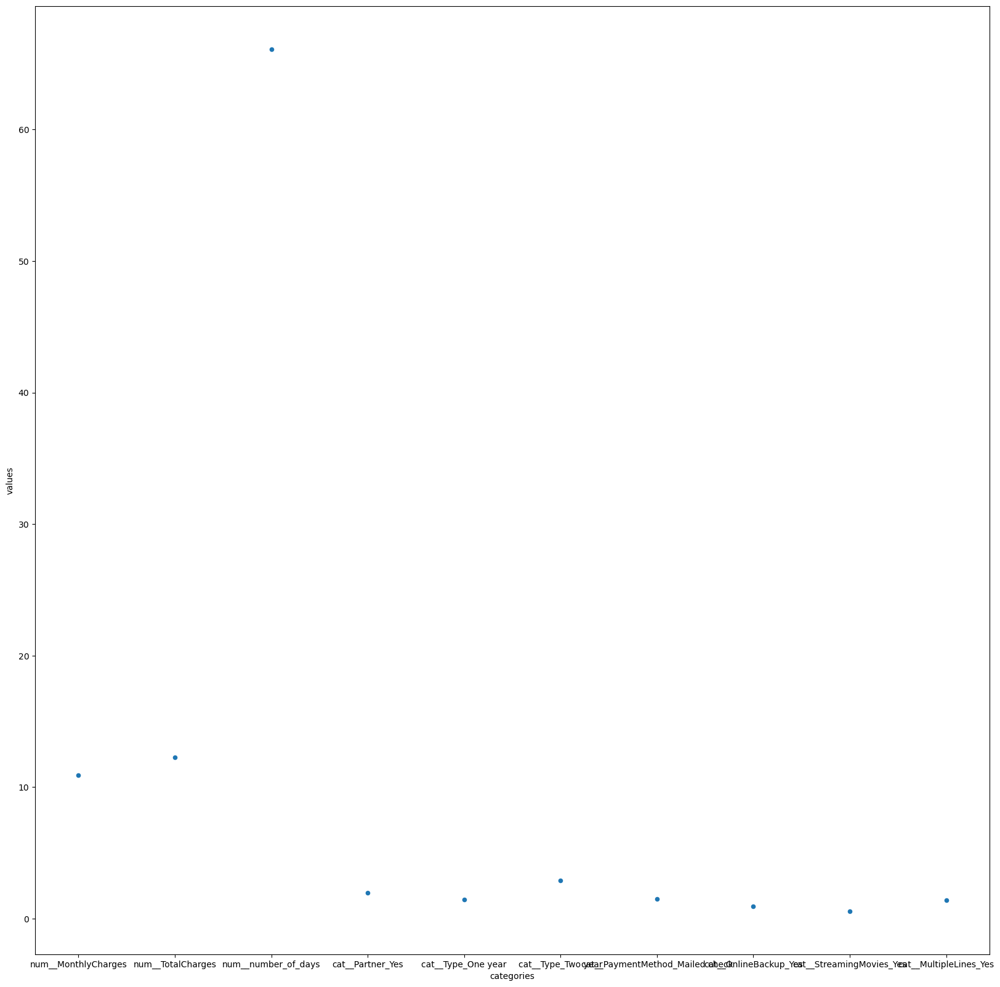

43:	total: 247ms	remaining: 2.28s
44:	total: 254ms	remaining: 2.28s
45:	total: 260ms	remaining: 2.29s
46:	total: 264ms	remaining: 2.27s
47:	total: 268ms	remaining: 2.24s
48:	total: 271ms	remaining: 2.22s
49:	total: 275ms	remaining: 2.2s
50:	total: 283ms	remaining: 2.22s
51:	total: 290ms	remaining: 2.22s
52:	total: 295ms	remaining: 2.21s
53:	total: 300ms	remaining: 2.2s
54:	total: 303ms	remaining: 2.18s
55:	total: 308ms	remaining: 2.16s
56:	total: 315ms	remaining: 2.17s
57:	total: 321ms	remaining: 2.17s
58:	total: 327ms	remaining: 2.17s
59:	total: 333ms	remaining: 2.16s
60:	total: 337ms	remaining: 2.15s
61:	total: 342ms	remaining: 2.14s
62:	total: 348ms	remaining: 2.13s
63:	total: 352ms	remaining: 2.12s
64:	total: 357ms	remaining: 2.11s
65:	total: 361ms	remaining: 2.1s
66:	total: 368ms	remaining: 2.1s
67:	total: 370ms	remaining: 2.08s
68:	total: 377ms	remaining: 2.08s
69:	total: 383ms	remaining: 2.08s
70:	total: 389ms	remaining: 2.07s
71:	total: 395ms	remaining: 2.07s
72:	total: 401ms	r

In [94]:
df.plot('x', 'y', kind='scatter', figsize = (20, 20), xlabel = 'categories', ylabel = 'values')
plt.show()

Наибольшее влияние на предсказание, уход клиента, оказывает параметр number_of_days, продолжительность пользования услугами компании. 

Также сильное влияние оказывают параметры месячный платеж (MonthlyCharges) и итоговая плата (TotalCharges).

# Вывод
Была проведена предобработка данных, исследовательский анализ, составлен портрет клиента.

Также изучили корреляцию между признаками, для обучения модели отобрали параметры, сильно коррелирующие с целевым признаком.
 
На основе обученной модели, выявили наиболее важные параметры для целевого признака.

# Отчет

В ходе выполнения работы были выполнены следующие шаги: составление портрета клиента (исследование признаков), определение наиболее важных признаков для целевого признака (корреляция), масштабирование данных для модели и кодирование, создание модели и подбор гиперпараметров, получена метрика модели, проведено тестирование модели и сделаны выводы.

Пункт анализ модели с помощью матрицы ошибок не был выполнен, оценка модели была произведена с помощью roc_auc и accuracy.

С помощью ящика с усами в одной из таблиц (contract) были обнаружены выбросы, которые были удалены.

При работе с данными, объединением таблиц, возникла мультикорреляция, которая была устранена путем удаления сильно коррелирующих признаков.

Также в данных отсутствовал целевой признак(leave); он был сформирован на основе другого параметра: EndDate. 

Ключевые шаги в решении задачи: 
1) предобработка данных (4 датасета)

2) исследовательский анализ(объединение датасетов и исследование признаков)

3) обучение модели

4) анализ параметров на основе модели

5) выводы о проделанной работе

Для обучения модели использовали следующие признаки: 
1) SeniorCitizen  
2) Partner           
3) Type              
4) PaperlessBilling   
5) PaymentMethod     
6) MonthlyCharges    
7) TotalCharges      
8) number_of_days    
9)  OnlineBackup      
10)  StreamingMovies    
11)  MultipleLines


*leave - целевой признак  


number_of_days - был сформирован на основе двух других параметров: BeginDate и EndDate

Признаки Type, PaperlessBilling, PaymentMethod, MonthlyCharges, TotalCharges и number_of_days находились в таблице contract. В этой таблице присутствовали выбросы, которые были удалены.

OnlineBackup, StreamingMovies находились в таблице internet, а  MultipleLines - в phone. Поскольку клиенты пользуются не всеми услугами и сервисами компании, то при объединении таблиц образовались пропуски. Если же в столбце присутствует пропуск, следовательно клиент не использовал эту услугу, пропуск заполняли значением 'not have'.

Итоговая модель:  CatBoostClassifier

c параметрами: 

               depth = 2,
               
               eval_metric = 'AUC',
               
               iterations = 10000,
               
               leaf_estimation_iterations = 8,
               
               logging_level = 'Silent',
               
               random_seed = 220523,
               
               random_strength = 3
                   
AUC-ROC модели на тестовой выборке: 0.9313676339808687

Accuracy модели на тестовой выборке: 0.939766081871345